# 1. 비즈니스 목표
목표 : 
유저의 행동 데이터를 분석해 **GMV(Gross Merchandise Value)** 상승 방안을 도출하고, 매출 향상에 기여할 수 있는 핵심 KPI와 개선 포인트를 찾는다.

# 2. 활용 데이터
- 캐글 이커머스 웹로그 데이터셋를 축소함 (전체 데이터셋의 양이 너무 커서 '2019년 10월' 한 달간의 데이터만 사용)
- 유저, 이벤트, 페이지, 이벤트 시각 등의 정보가 들어 있음
- 유저의 행동 경로를 파악하여 최종 목표(결제 등)까지 도달하는 과정에서의 개선점을 도출할 수 있음
- 전체 데이터
https://www.kaggle.com/datasets/mkechinov/ecommerce-behavior-data-from-multi-category-store

In [1]:
import warnings
warnings.filterwarnings("ignore")

import sys
if hasattr(sys.stdout, "reconfigure"):
    try:
        sys.stdout.reconfigure(encoding="utf-8")
    except Exception:
        pass

import matplotlib.pyplot as plt
plt.rcParams["font.sans-serif"] = [
    "Malgun Gothic", "맑은 고딕", "AppleGothic", "NanumGothic", "Noto Sans CJK KR", "sans-serif"
]
plt.rcParams["axes.unicode_minus"] = False

import pandas as pd
import numpy as np

data = pd.read_csv("./web_log_data.csv")


In [2]:
data.head()

,event_time,event_type,product_id,category_id,category_code,brand,price,user_id,user_session
0,2019-10-01 00:00:00,view,44600062,2103807459595387724,NaN,shiseido,35.79,541312140,72d76fde-8bb3-4e00-8c23-a032dfed738c
1,2019-10-01 00:00:15,view,44600062,2103807459595387724,NaN,shiseido,35.79,541312140,72d76fde-8bb3-4e00-8c23-a032dfed738c
2,2019-10-01 00:00:23,view,1004739,2053013555631882655,electronics.smartphone,xiaomi,197.55,519530528,9882d21f-2c5f-496b-90d4-a1503edb6562
3,2019-10-01 00:00:25,view,19001139,2053013557225718275,NaN,gran-stone,67.58,525734504,83f584ed-c7f7-442e-8ae9-713cb27fdece
4,2019-10-01 00:00:41,view,1003141,2053013555631882655,electronics.smartphone,apple,382.97,551377651,ca11a570-47da-4630-898b-9a03127703da


- event_time: 이벤트가 발생한 시각
- event_type: 이벤트 종류
    - view: 상품을 조회
    - cart: 상품을 카트에 추가
    - remove_from_cart: 상품을 카트에서 제거
    - purchase: 구매
- product_id: 상품번호
- category_id: 카테고리번호
- category_code: 카테고리명
- brand: 브랜드명
- price: 상품 가격
- user_id: 고객번호
- user_session: 세션

## 2.1. 데이터 전처리

In [3]:
# 데이터 살펴보기
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6610750 entries, 0 to 6610749
Data columns (total 9 columns):
 #   Column         Dtype  
---  ------         -----  
 0   event_time     object 
 1   event_type     object 
 2   product_id     int64  
 3   category_id    int64  
 4   category_code  object 
 5   brand          object 
 6   price          float64
 7   user_id        int64  
 8   user_session   object 
dtypes: float64(1), int64(3), object(5)
memory usage: 453.9+ MB


In [4]:
# 데이터 타입 변경
data['event_time'] = pd.to_datetime(data['event_time'], format='%Y-%m-%d %H:%M:%S')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6610750 entries, 0 to 6610749
Data columns (total 9 columns):
 #   Column         Dtype         
---  ------         -----         
 0   event_time     datetime64[ns]
 1   event_type     object        
 2   product_id     int64         
 3   category_id    int64         
 4   category_code  object        
 5   brand          object        
 6   price          float64       
 7   user_id        int64         
 8   user_session   object        
dtypes: datetime64[ns](1), float64(1), int64(3), object(4)
memory usage: 453.9+ MB


In [5]:
# 결측치 확인 및 제거
display(data.isna().sum())

# 카테고리나 브랜드 정보로 분석할 계획은 X
data.drop(['category_id', 'category_code', 'brand'], axis=1, inplace=True)
display(data.head())


event_time             0
event_type             0
product_id             0
category_id            0
category_code    2152844
brand            1071029
price                  0
user_id                0
user_session           0
dtype: int64

,event_time,event_type,product_id,price,user_id,user_session
0,2019-10-01 00:00:00,view,44600062,35.79,541312140,72d76fde-8bb3-4e00-8c23-a032dfed738c
1,2019-10-01 00:00:15,view,44600062,35.79,541312140,72d76fde-8bb3-4e00-8c23-a032dfed738c
2,2019-10-01 00:00:23,view,1004739,197.55,519530528,9882d21f-2c5f-496b-90d4-a1503edb6562
3,2019-10-01 00:00:25,view,19001139,67.58,525734504,83f584ed-c7f7-442e-8ae9-713cb27fdece
4,2019-10-01 00:00:41,view,1003141,382.97,551377651,ca11a570-47da-4630-898b-9a03127703da


In [6]:
#  날짜 컬럼 추가
data['date_ymd'] = data['event_time'].dt.date
data.head()

,event_time,event_type,product_id,price,user_id,user_session,date_ymd
0,2019-10-01 00:00:00,view,44600062,35.79,541312140,72d76fde-8bb3-4e00-8c23-a032dfed738c,2019-10-01
1,2019-10-01 00:00:15,view,44600062,35.79,541312140,72d76fde-8bb3-4e00-8c23-a032dfed738c,2019-10-01
2,2019-10-01 00:00:23,view,1004739,197.55,519530528,9882d21f-2c5f-496b-90d4-a1503edb6562,2019-10-01
3,2019-10-01 00:00:25,view,19001139,67.58,525734504,83f584ed-c7f7-442e-8ae9-713cb27fdece,2019-10-01
4,2019-10-01 00:00:41,view,1003141,382.97,551377651,ca11a570-47da-4630-898b-9a03127703da,2019-10-01


# 3. 데이터 분석

## 3.1. KPI 설정 및 분석

### DAU, MAU
우리 서비스에 몇명이나 접속하고 유저수가 얼마나 성장하고 있는지 트래킹할 때 사용하는 기본적인 지표

- DAU : 일간 활성 사용자수
- MAU : 월간 활성 사용자수

In [7]:
dau = data.groupby('date_ymd')[['user_id']].nunique().reset_index()
dau.columns = ['date_ymd', 'dau']
display(dau.head())

,date_ymd,dau
0,2019-10-01,12799
1,2019-10-02,13074
2,2019-10-03,12977
3,2019-10-04,15907
4,2019-10-05,14282


In [8]:
data['month'] = data['event_time'].dt.month
mau = data.groupby(['month'])[['user_id']].nunique().reset_index()
mau.columns = ['month', 'mau']
mau

,month,mau
0,10,91653


→ 10월 한 달간의 데이터만 사용하므로 mau보다 dau지표를 확인하는 것이 유의미할 것이다.

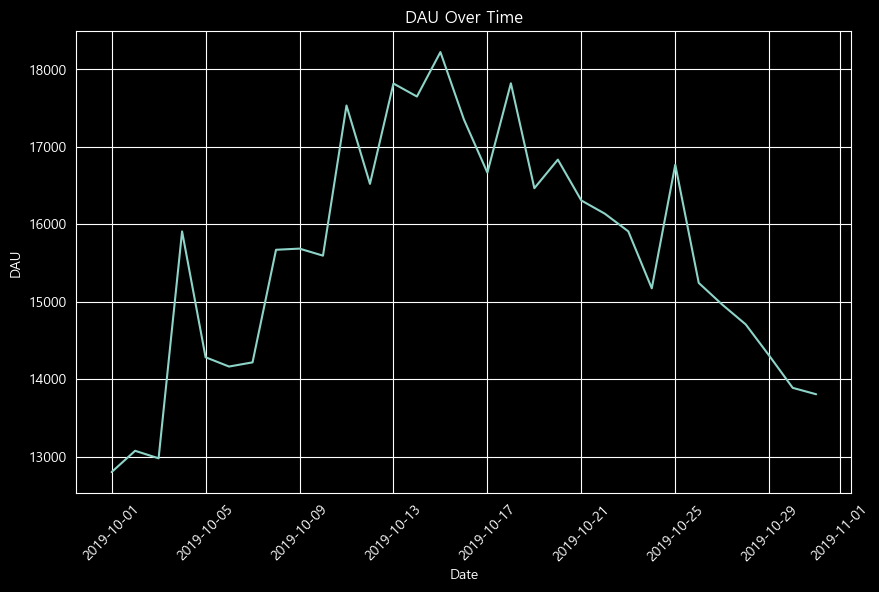

In [9]:
# 날짜별 DAU 그래프 시각화

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.lineplot(x='date_ymd', y='dau', data=dau)
plt.title('DAU Over Time')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('DAU')
plt.show()

### 체류시간
- 웹페이지에 체류하고 있는 시간
- 세션별로 MAX 시각과 MIN 시각의 차이로 계산

결제창에서 체류시간이 길면 결제 안하고 떠날 확률이 높고, 첫 방문 시 체류시간 너무 짧으면 이탈할 확률이 높을 것이다.

In [10]:
duration = data.groupby(['user_id', 'user_session', 'date_ymd'])['event_time'].agg(['min', 'max']).reset_index()
duration.head() 

,user_id,user_session,date_ymd,min,max
0,266287781,118dbcd6-fe31-4cc9-bf87-1e592124f4ee,2019-10-25,2019-10-25 03:52:09,2019-10-25 03:52:09
1,266287781,32023c94-c676-455b-8713-4dad692e609d,2019-10-25,2019-10-25 03:52:55,2019-10-25 03:52:55
2,266287781,56f6e473-53b1-4735-b2a2-e853ee391ba2,2019-10-28,2019-10-28 11:55:55,2019-10-28 11:55:55
3,266287781,992d03b4-c561-4fba-a0d8-c03886452884,2019-10-26,2019-10-26 12:15:56,2019-10-26 12:22:55
4,266287781,9ca89901-1b2c-4278-9890-5b576e9b07ca,2019-10-25,2019-10-25 03:50:49,2019-10-25 03:50:49


In [11]:
duration['duration'] = (duration['max'] - duration['min']).dt.total_seconds()
duration.head()

,user_id,user_session,date_ymd,min,max,duration
0,266287781,118dbcd6-fe31-4cc9-bf87-1e592124f4ee,2019-10-25,2019-10-25 03:52:09,2019-10-25 03:52:09,0.0
1,266287781,32023c94-c676-455b-8713-4dad692e609d,2019-10-25,2019-10-25 03:52:55,2019-10-25 03:52:55,0.0
2,266287781,56f6e473-53b1-4735-b2a2-e853ee391ba2,2019-10-28,2019-10-28 11:55:55,2019-10-28 11:55:55,0.0
3,266287781,992d03b4-c561-4fba-a0d8-c03886452884,2019-10-26,2019-10-26 12:15:56,2019-10-26 12:22:55,419.0
4,266287781,9ca89901-1b2c-4278-9890-5b576e9b07ca,2019-10-25,2019-10-25 03:50:49,2019-10-25 03:50:49,0.0


In [12]:
# 날짜별 평균 체류시간 계산
duration_mean = duration.groupby('date_ymd')['duration'].mean().reset_index()
duration_mean.head()

,date_ymd,duration
0,2019-10-01,497.343132
1,2019-10-02,484.670291
2,2019-10-03,495.753052
3,2019-10-04,496.113484
4,2019-10-05,532.591555


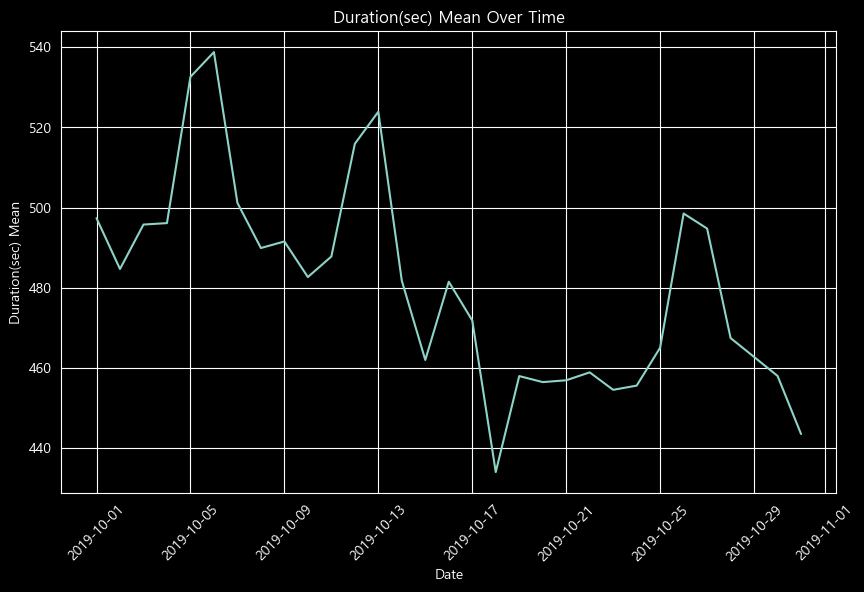

In [13]:
# 날짜별 체류시간 시각화
plt.figure(figsize=(10, 6))
sns.lineplot(x='date_ymd', y='duration', data=duration_mean)
plt.title('Duration(sec) Mean Over Time')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Duration(sec) Mean')
plt.show()

### 전환율, GMV
#### GMV = DAU × 인당 상품조회수 × 구매전환율 × 상품주문단가
- 인당 상품조회수 = 상품조회수 / DAU
- 구매전환율 = 상품주문수 / 상품조회수
- 상품주문단가 = GMV / 상품주문수

In [14]:
result = data.groupby('date_ymd').agg(
    dau=('user_id', 'nunique'),
    view_count=('event_type', lambda x: (x == 'view').sum()),
    purchase_count=('event_type', lambda x: (x == 'purchase').sum()),
    gmv=('price', lambda x: x[data['event_type'] == 'purchase'].sum()),
).reset_index()

result['avg_view_per_user'] = result['view_count'] / result['dau']
result['conversion_rate'] = result['purchase_count'] / result['view_count']
result['avg_purchase_price'] = result['gmv'] / result['purchase_count']

result = result.fillna(0)

result.head()

,date_ymd,dau,view_count,purchase_count,gmv,avg_view_per_user,conversion_rate,avg_purchase_price
0,2019-10-01,12799,172221,2441,748890.62,13.455817,0.014174,306.796649
1,2019-10-02,13074,169059,2447,773641.23,12.930932,0.014474,316.159064
2,2019-10-03,12977,174081,2659,857984.08,13.414580,0.015274,322.671711
3,2019-10-04,15907,211866,3628,1123036.87,13.319042,0.017124,309.547098
4,2019-10-05,14282,199306,3258,1017097.86,13.955048,0.016347,312.184733


Text(0, 0.5, 'GMV')

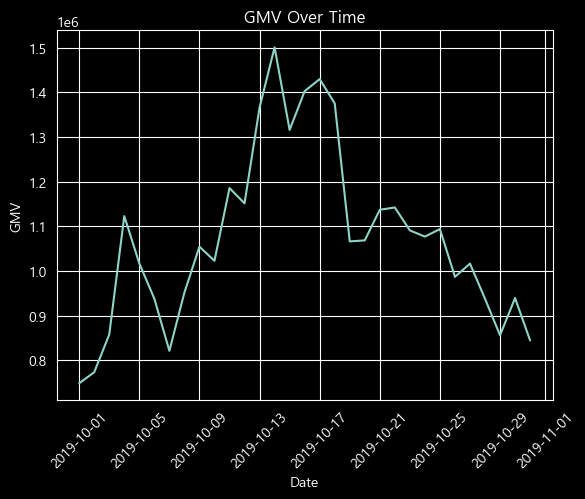

In [15]:
# 날짜별 GMV 시각화
sns.lineplot(x='date_ymd', y='gmv', data=result)
plt.title('GMV Over Time')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('GMV')

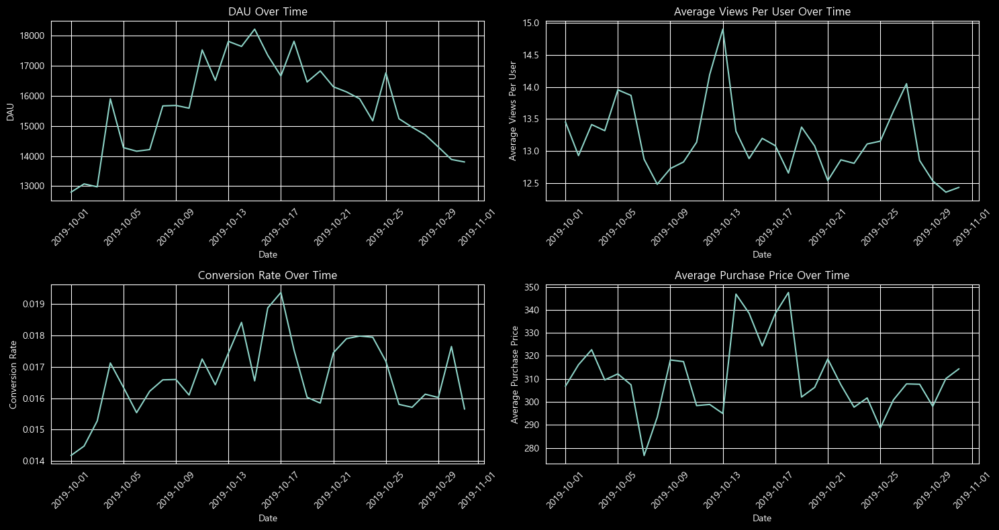

In [16]:
# DAU, 인당상품조회수, 전환율, 상품주문단가 시각화
plt.figure(figsize=(15, 8))

plt.subplot(2, 2, 1)
sns.lineplot(x='date_ymd', y='dau', data=result)
plt.title('DAU Over Time')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('DAU')

plt.subplot(2, 2, 2)
sns.lineplot(x='date_ymd', y='avg_view_per_user', data=result)
plt.title('Average Views Per User Over Time')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Average Views Per User')

plt.subplot(2, 2, 3)
sns.lineplot(x='date_ymd', y='conversion_rate', data=result)
plt.title('Conversion Rate Over Time')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Conversion Rate')

plt.subplot(2, 2, 4)
sns.lineplot(x='date_ymd', y='avg_purchase_price', data=result)
plt.title('Average Purchase Price Over Time')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Average Purchase Price')

plt.tight_layout()
plt.show()

### KPI 설정 및 분석 결론

📌 핵심 인사이트

1. GMV 결정 구조

* GMV는 DAU(유입)와 구매전환율(전환)에 의해 결정되는 구조

* 매출 변동은 유입 규모 + 구매전환 효율 변화에 직접적으로 영향


2. 핵심 KPI 영향도

* DAU와 구매전환율은 GMV와 유사한 흐름을 보이며 주요 영향 변수로 작용

* 반면 인당 상품조회수, 상품주문단가는 GMV와 뚜렷한 연관성이 나타나지 않음


3. 매출 성장 구조

* 매출 증가는 단순 탐색 증가가 아닌 유입 확대와 전환율 개선에서 발생

* 따라서 DAU 확보와 전환 최적화가 핵심 성장 전략으로 판단됨


🎯 Action 방향

1. 채널별 전환율 기반 유입 최적화
광고 채널별 유입 대비 구매전환율 비교 후 효율적인 채널 중심으로 예산 재배분

* ex) 검색광고 (2.8%) > SNS 광고 (1.2%) > 디스플레이 광고 (0.6%)
    * → 검색광고 예산 확대
    * → 디스플레이 광고 예산 축소


2. View → Cart 전환율 개선 (A/B 테스트)
상품 상세페이지에서 장바구니 버튼 위치 / 색상 / 문구 변경 실험을 통해 전환율 개선

* ex) 장바구니 버튼 하단 고정 + 강조 색상 적용
    * → CTR 12% 증가
    * → 전환율 0.35%p 증가

## 3.2. 퍼널 분석

고객들이 우리가 설계한 유저 경험 루트를 따라 잘 도착하고 있는지 확인해보기 위해 최초 유입부터 최종 목적지까지 여정 단계를 나누어서 살펴보고자 한다.



In [17]:
# 상품조회(view), 장바구니(cart), 구매(purchase) 단계로 구성

total_view = len(data.query('event_type == "view"'))
total_cart = len(data.query('event_type == "cart"'))
total_purchase = len(data.query('event_type == "purchase"'))

funnel = pd.DataFrame({
    'event_type': ['View', 'Cart', 'Purchase'],
    'count': [total_view, total_cart, total_purchase],
    'rate': [(total_view/total_view), (total_cart/total_view), (total_purchase/total_view)]
})

display(funnel)

,event_type,count,rate
0,View,6379532,1.000000
1,Cart,124252,0.019477
2,Purchase,106966,0.016767


In [18]:
# 퍼널 시각화

import plotly.express as px

fig = px.funnel(data_frame=funnel, x='event_type', y='rate')
fig.update_traces(texttemplate="%{value:,.2%}")
fig.show()

### 대부분의 이탈이 view → cart 구간에서 발생한다.
view → cart 로 넘어가는 집단과 view 까지만 도달한 집단의 차이점에 대해서 분석해보자

In [19]:
# 1. 그룹별 지표 산출
# view_to_cart vs view_drop

# 세션 단위 행동 지표 생성
session_features = (
    data.groupby('user_session')
    .agg(
        user_id=('user_id', 'first'),
        session_start=('event_time', 'min'),
        session_end=('event_time', 'max'),
        view_count=('event_type', lambda x: (x == 'view').sum()),
        cart_count=('event_type', lambda x: (x == 'cart').sum()),
        unique_product_count=('product_id', 'nunique'),
        avg_price=('price', 'mean'),
        max_price=('price', 'max')
    )
    .reset_index()
)

# 체류시간 계산
session_features['duration_sec'] = (
    session_features['session_end'] - session_features['session_start']
).dt.total_seconds()

# 그룹 정의
view_sessions = session_features[session_features['view_count'] > 0].copy()

view_sessions['group'] = np.where(
    view_sessions['cart_count'] > 0,
    'view_to_cart',
    'view_drop'
)

# 분석 대상 지표
metrics = [
    'view_count',
    'unique_product_count',
    'duration_sec',
    'avg_price',
    'max_price'
]

# 그룹별 평균 산출
group_summary = (
    view_sessions
    .groupby('group')[metrics]
    .mean()
    .T
)

display(group_summary)

group,view_drop,view_to_cart
view_count,6.695825,8.324244
unique_product_count,4.360643,4.087206
duration_sec,754.657285,972.366532
avg_price,294.676295,342.499582
max_price,421.711706,461.935859


In [20]:
# 2. 그룹별 지표 차이 비교

comparison_table = pd.DataFrame({
    'view_drop': group_summary['view_drop'],
    'view_to_cart': group_summary['view_to_cart'],
    'difference': group_summary['view_to_cart'] - group_summary['view_drop']
})

comparison_table['difference_rate_%'] = (
    comparison_table['difference'] / comparison_table['view_drop'] * 100
).replace([np.inf, -np.inf], np.nan)

display(comparison_table)

,view_drop,view_to_cart,difference,difference_rate_%
view_count,6.695825,8.324244,1.628419,24.319915
unique_product_count,4.360643,4.087206,-0.273436,-6.270550
duration_sec,754.657285,972.366532,217.709246,28.848757
avg_price,294.676295,342.499582,47.823286,16.229092
max_price,421.711706,461.935859,40.224154,9.538306


In [21]:
# 3. 통계검정 결과
# 정규성 만족: Welch t-test
# 정규성 불만족: Mann-Whitney U test

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

converted = view_sessions[view_sessions['group'] == 'view_to_cart']
dropped = view_sessions[view_sessions['group'] == 'view_drop']

test_results = []

for metric in metrics:
    x = converted[metric].dropna()
    y = dropped[metric].dropna()

    # 표본 수가 크면 Shapiro 검정이 과민하므로 최대 5,000개 샘플링
    x_sample = x.sample(min(len(x), 5000), random_state=42)
    y_sample = y.sample(min(len(y), 5000), random_state=42)

    _, p_norm_x = shapiro(x_sample)
    _, p_norm_y = shapiro(y_sample)

    is_normal = (p_norm_x >= 0.05) and (p_norm_y >= 0.05)

    if is_normal:
        selected_test = 'Welch t-test'
        statistic, p_value = ttest_ind(x, y, equal_var=False)
    else:
        selected_test = 'Mann-Whitney U test'
        statistic, p_value = mannwhitneyu(x, y, alternative='two-sided')

    test_results.append({
        'metric': metric,
        'normality_p_view_to_cart': p_norm_x,
        'normality_p_view_drop': p_norm_y,
        'selected_test': selected_test,
        'statistic': statistic,
        'p_value': p_value,
        'significant_0.05': p_value < 0.05
    })

test_result_table = pd.DataFrame(test_results)

# p-value 기준 유의성 순위 추가
test_result_table = test_result_table.sort_values('p_value', ascending=True).reset_index(drop=True)
test_result_table['significance_rank'] = test_result_table.index + 1

# 컬럼 순서 정리
test_result_table = test_result_table[
    [
        'significance_rank',
        'metric',
        'normality_p_view_to_cart',
        'normality_p_view_drop',
        'selected_test',
        'statistic',
        'p_value',
        'significant_0.05'
    ]
]

test_result_table = test_result_table.reset_index(drop=True)
display(test_result_table)

,significance_rank,metric,normality_p_view_to_cart,normality_p_view_drop,selected_test,statistic,p_value,significant_0.05
0,1,view_count,2.436008e-79,3.138097e-85,Mann-Whitney U test,3.615977e+10,0.000000e+00,True
1,2,duration_sec,1.612932e-95,2.479165e-95,Mann-Whitney U test,4.110103e+10,0.000000e+00,True
2,3,avg_price,3.908543e-62,1.739198e-64,Mann-Whitney U test,3.476595e+10,0.000000e+00,True
3,4,max_price,2.295696e-60,1.427990e-64,Mann-Whitney U test,3.404253e+10,0.000000e+00,True
4,5,unique_product_count,1.824806e-79,8.993400e-78,Mann-Whitney U test,3.038060e+10,2.997794e-21,True


### 퍼널 분석 결론

📌 핵심 인사이트

1. 주요 이탈 구간

* View → Cart 전환율 약 1.95%로 주요 이탈 구간

* 대부분의 사용자가 상품 조회 이후 장바구니 단계로 이어지지 않음

2. 전환 그룹 vs 이탈 그룹 행동 차이

* 전환 그룹은 이탈 그룹 대비 상품 조회 수, 체류시간, 조회 상품 가격 수준(avg/max price)이 더 높음

* 반면 이탈 그룹은 상품 다양성(unique_product_count)만 더 높게 나타남

3. 탐색 방식 차이

* 전환 그룹은 소수 상품을 깊게 탐색하며 구매로 이어짐

* 이탈 그룹은 여러 상품을 얕게 탐색한 후 이탈하는 패턴을 보임


🎯 Action 방향

1. 핵심 상품 중심 탐색 유도 (탐색 깊이 강화)
여러 상품을 비교 탐색하는 사용자에 대해 특정 상품 집중 탐색으로 유도

* ex) view_count ≥ N 사용자에게 추천 상품 개수 축소 (예: 10개 → 3개)
    * → 선택지 제한을 통해 탐색 분산을 줄이고 의사결정 집중 유도


2. 고가 상품 탐색 사용자 전환 유도 강화
* 평균 가격(avg_price), 최대 가격(max_price)이 높은 사용자
* → 구매 의사는 있으나 가격 부담으로 이탈 가능성 높음
    * ex) avg_price ≥ X 또는 max_price ≥ Y 사용자에게 할인 쿠폰 / 카드 혜택 / 할부 정보 강조 노출
    * → 가격 부담 완화 → 구매 전환 연결




## 3.3. 리텐션 분석


- 리텐션: 특정 기간이 지나도 유지되는 고객수
1) 코호트 리텐션
    - 코호트: 동질적인 특성을 공유하는 사람들의 집합
    - ex) 같은 시기에 처음 방문한 유저들, 나이가 같은 유저들, 특정 행동 한 유저들 등
    - 동일한 코호트끼리 리텐션을 비교

2) 리텐션 커브
    - 리텐션을 라인 차트로 시각화
    - 시간이 경과함에 따라 얼마나 retain 되는지를 직관적으로 파악

### 3.3.1. 코호트 리텐션

In [22]:
import sqlite3

conn = sqlite3.connect(":memory:")
data.to_sql('data', conn, index=False, if_exists='replace')

6610750

In [23]:
query_retention_rate = """
WITH first_visit AS (
    SELECT user_id, MIN(date_ymd) AS first_visit_date
    FROM data
    GROUP BY user_id
),
retention_cohort AS (
    SELECT fv.user_id, fv.first_visit_date, d.date_ymd,
           CAST(JULIANDAY(d.date_ymd) - JULIANDAY(fv.first_visit_date) AS INT) AS days_since_first_visit
    FROM first_visit fv
    JOIN data d ON fv.user_id = d.user_id
),
daily_active_users AS (
    SELECT first_visit_date, days_since_first_visit, COUNT(DISTINCT user_id) AS retained_users
    FROM retention_cohort
    WHERE days_since_first_visit >= 0
    GROUP BY first_visit_date, days_since_first_visit
),
total_users AS (
    SELECT first_visit_date, COUNT(DISTINCT user_id) AS total_users_cohort
    FROM first_visit
    GROUP BY first_visit_date
)
SELECT dau.first_visit_date, dau.days_since_first_visit,
       dau.retained_users, tu.total_users_cohort,
       CAST(dau.retained_users AS REAL) / tu.total_users_cohort AS retention_rate
FROM daily_active_users dau
JOIN total_users tu ON dau.first_visit_date = tu.first_visit_date
ORDER BY dau.first_visit_date, dau.days_since_first_visit;
"""
retention_rate = pd.read_sql(query_retention_rate, conn)
retention_rate.head(5)

,first_visit_date,days_since_first_visit,retained_users,total_users_cohort,retention_rate
0,2019-10-01,0,12799,12799,1.000000
1,2019-10-01,1,4654,12799,0.363622
2,2019-10-01,2,4103,12799,0.320572
3,2019-10-01,3,4596,12799,0.359091
4,2019-10-01,4,4012,12799,0.313462


In [24]:
retention_pivot = retention_rate.pivot_table(
    index='first_visit_date',
    columns='days_since_first_visit',
    values='retention_rate',
    aggfunc='sum'
).fillna(0)

retention_pivot.head()

days_since_first_visit,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
first_visit_date,,,,,,,,,,,,,,,,,,,,,
2019-10-01,1.0,0.363622,0.320572,0.359091,0.313462,0.294242,0.291820,0.300648,0.291585,0.288538,...,0.242441,0.245957,0.236581,0.257051,0.227830,0.223377,0.230565,0.216658,0.213610,0.214548
2019-10-02,1.0,0.292518,0.310926,0.259857,0.248219,0.245487,0.245606,0.251544,0.249762,0.270903,...,0.211639,0.195962,0.221021,0.196318,0.190974,0.196556,0.186580,0.181116,0.180641,0.000000
2019-10-03,1.0,0.312744,0.233505,0.221806,0.225550,0.229449,0.218531,0.220870,0.242396,0.227266,...,0.189362,0.204960,0.178131,0.184371,0.180003,0.180315,0.170800,0.163937,0.000000,0.000000
2019-10-04,1.0,0.263606,0.212769,0.196770,0.203050,0.208134,0.203200,0.225478,0.210377,0.239085,...,0.194378,0.170604,0.166567,0.162679,0.153110,0.147578,0.149970,0.000000,0.000000,0.000000
2019-10-05,1.0,0.254251,0.202820,0.194110,0.186852,0.182912,0.212982,0.198673,0.215886,0.188304,...,0.165906,0.161344,0.135836,0.147449,0.142265,0.137287,0.000000,0.000000,0.000000,0.000000


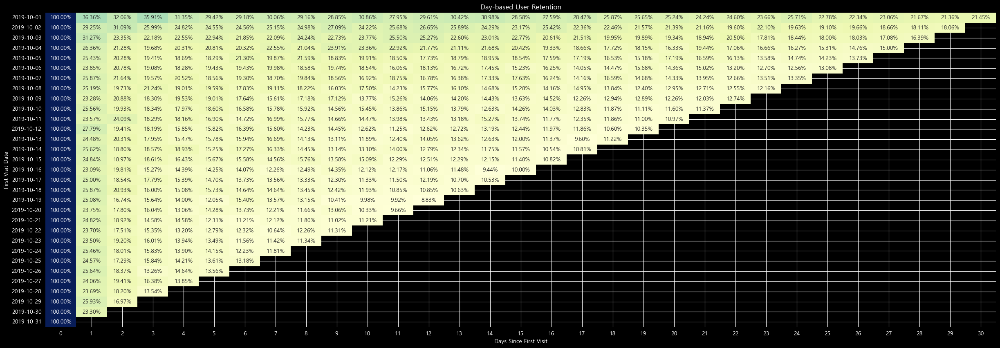

In [25]:
# 코호트 리텐션 시각화
## 첫 번째 방문 날짜를 기준으로 리텐션을 계산하고, 각 날짜별로 몇 퍼센트의 유저가 유지되는지 시각화
plt.figure(figsize=(30, 10))
sns.heatmap(retention_pivot, annot=True, fmt=".2%", cmap="YlGnBu", cbar=False, mask=(retention_pivot == 0))
plt.title("Day-based User Retention")
plt.xlabel("Days Since First Visit")
plt.ylabel("First Visit Date")
plt.show()

### 3.3.2. 리텐션 커브

,days_since_first_visit,retention_rate
0,0,1.000000
1,1,0.255395
2,2,0.203548
3,3,0.183153
4,4,0.173372
5,5,0.169837
6,6,0.167992
7,7,0.167204
8,8,0.167196
9,9,0.164192


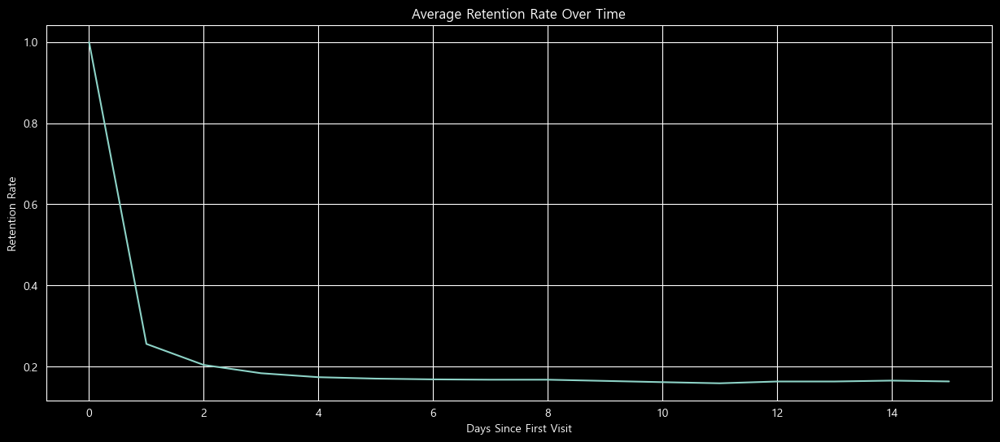

In [26]:
# 한달치 데이터만 가지고 있어서 15일 이후는 평균을 냈을때 
# 너무 적은 수(충분하지 못한 데이터량)만 들어 있어서 15일까지로 범위 제한

retention_avg = retention_rate.query('days_since_first_visit <= 15').groupby('days_since_first_visit')['retention_rate'].mean().reset_index() 

display(retention_avg)

plt.figure(figsize=(15, 6))
sns.lineplot(x='days_since_first_visit', y='retention_rate', data=retention_avg)
plt.title('Average Retention Rate Over Time')
plt.xlabel('Days Since First Visit')
plt.ylabel('Retention Rate')
plt.show()

In [27]:
day1_retention = retention_rate.query('days_since_first_visit==1')[['first_visit_date', 'retention_rate']]
display(day1_retention.head())

day3_retention = retention_rate.query('days_since_first_visit==3')[['first_visit_date', 'retention_rate']]
display(day3_retention.head())

day7_retention = retention_rate.query('days_since_first_visit==7')[['first_visit_date', 'retention_rate']]
display(day7_retention.head())

,first_visit_date,retention_rate
1,2019-10-01,0.363622
32,2019-10-02,0.292518
62,2019-10-03,0.312744
91,2019-10-04,0.263606
119,2019-10-05,0.254251


,first_visit_date,retention_rate
3,2019-10-01,0.359091
34,2019-10-02,0.259857
64,2019-10-03,0.221806
93,2019-10-04,0.196770
121,2019-10-05,0.194110


,first_visit_date,retention_rate
7,2019-10-01,0.300648
38,2019-10-02,0.251544
68,2019-10-03,0.220870
97,2019-10-04,0.225478
125,2019-10-05,0.198673


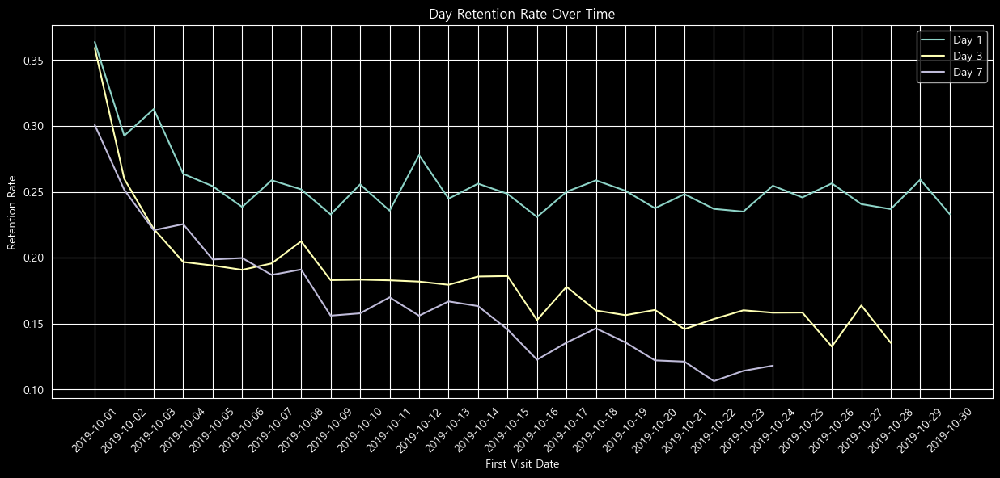

In [28]:
# 첫 방문 날짜별로 1일, 3일, 7일 리텐션을 시각화
# ex) 파란색 그래프 : 첫 방문 일자 별로 1일 지났을 때 리텐션이 어떻게 나타나는지

day1_retention = retention_rate[retention_rate['days_since_first_visit'] == 1][
    ['first_visit_date', 'retention_rate']
]
day3_retention = retention_rate[retention_rate['days_since_first_visit'] == 3][
    ['first_visit_date', 'retention_rate']
]
day7_retention = retention_rate[retention_rate['days_since_first_visit'] == 7][
    ['first_visit_date', 'retention_rate']
]

plt.figure(figsize=(15, 6))
sns.lineplot(x='first_visit_date', y='retention_rate', data=day1_retention, label='Day 1')
sns.lineplot(x='first_visit_date', y='retention_rate', data=day3_retention, label='Day 3')
sns.lineplot(x='first_visit_date', y='retention_rate', data=day7_retention, label='Day 7')
plt.title('Day Retention Rate Over Time')
plt.legend()
plt.xlabel('First Visit Date')
plt.ylabel('Retention Rate')
plt.xticks(rotation=45)
plt.show()

첫 방문 일자 이후 시간이 지날수록 리텐션이 떨어지는 것은 일반적인 현상이나, 첫 방문일 월초가 아닌 월말에 가까울수록 리텐션이 저하되는 현상 발견

→ 고객들이 월초에 방문하도록 유도할 필요 있음

### 가설 설정

퍼널 분석의 view → cart 전환 분석에서 다양한 행동 지표에 대해 통계검정을 수행한 결과,
상품조회수(view_count)는 두 그룹 간 가장 유의미한 차이를 보이는 핵심 변수로 확인되었다.

특히 장바구니로 전환된 세션일수록 상품조회수가 더 높은 경향이 나타났으며,
이는 사용자 탐색 행동이 이후 전환 및 잔존에 중요한 영향을 미칠 가능성을 시사한다.

이에 따라 초기 사용자 행동 중 가장 직접적으로 탐색 수준을 나타내는 지표인
'상품조회수'를 기준으로 리텐션 가설을 설정하였다.

---

**가설 : 처음 방문한 날에 상품조회수가 높을수록 리텐션이 높아지고, 낮을수록 리텐션은 떨어질 것이다.**

→ 해당 가설이 검증될 경우,
첫 방문 시점에서 사용자에게 더 많은 상품 탐색을 유도하는 방향으로
UX 및 추천 전략을 설계하는 것이 효과적인 리텐션 개선 방안이 될 수 있다.

count    91652.000000
mean        12.930334
std         20.066606
min          1.000000
10%          1.000000
20%          2.000000
30%          3.000000
40%          5.000000
50%          7.000000
60%          9.000000
70%         13.000000
80%         19.000000
90%         31.000000
max       1524.000000
dtype: float64

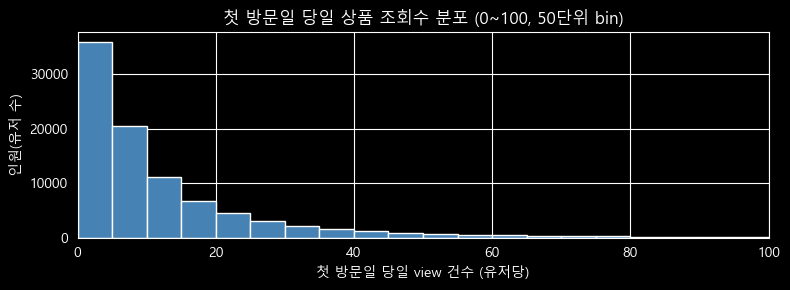

In [29]:
# 첫 방문일(상품 view 기준) 당일, 유저별 상품 조회(view) 건수 분포

v = data[data["event_type"] == "view"].copy()
v["d"] = pd.to_datetime(v["date_ymd"])

fv = v.groupby("user_id", as_index=False).agg(first_visit_date=("d", "min"))
day1 = v.merge(fv, on="user_id")
day1 = day1[day1["d"] == day1["first_visit_date"]]

n_view = day1.groupby("user_id").size()  # 첫날 view 행 수 = 그날 조회수(건)

display(n_view.describe(percentiles=[.1, .2, .3, .4, .5, .6, .7, .8, .9]))

n_view.hist(
    bins=20,
    range=(0, 100),
    figsize=(8, 3),
    color="steelblue",
    edgecolor="white",
)
plt.xlim(0, 100)
plt.xlabel("첫 방문일 당일 view 건수 (유저당)")
plt.ylabel("인원(유저 수)")
plt.title("첫 방문일 당일 상품 조회수 분포 (0~100, 50단위 bin)")
plt.tight_layout()
plt.show()

#### 조회수 분포 확인 후 그룹화 기준 설정

조회수 분포를 확인한 결과, 대부분의 유저는 낮은 조회수 구간에 밀집되어 있으며 일부 유저가 높은 조회수를 보이는 비대칭 분포를 확인할 수 있다.
이에 따라 조회수 수준에 따른 사용자 행동 차이를 비교하기 위해
조회수 0 ~ 5, 6 ~ 10, 11 ~ 30, 31 이상으로 구간을 나누어 분석을 진행한다.

In [30]:
# 코호트를 조회수 구간 별로 나누어서 리텐션 분석
# a그룹 : 조회수 0~5
# b그룹 : 조회수 6~10
# c그룹 : 조회수 11~30
# d그룹 : 조회수 31~

query_cohort_retention = """
WITH first_visit AS (
    SELECT user_id, MIN(date_ymd) AS first_visit_date
    FROM data
    WHERE event_type = 'view'
    GROUP BY user_id
),
first_visit_with_views AS (
    SELECT d.user_id
        , first_visit_date
        , CASE WHEN COUNT(d.user_id) >= 0 AND COUNT(d.user_id) <= 5 THEN 'a. 0~5'
            WHEN COUNT(d.user_id) >= 6 AND COUNT(d.user_id) <= 10 THEN 'b. 6~10'
            WHEN COUNT(d.user_id) >= 11 AND COUNT(d.user_id) <= 30 THEN 'c. 11~30'
            WHEN COUNT(d.user_id) >= 31 THEN 'd. 31~'
            ELSE NULL END AS views
    FROM data d
    JOIN first_visit fv ON d.user_id = fv.user_id AND d.date_ymd = fv.first_visit_date
    WHERE d.event_type = 'view'
    GROUP BY d.user_id, first_visit_date
),
retention_cohort AS (
    SELECT fv.user_id, fv.first_visit_date, fv.views, d.date_ymd,
           CAST(JULIANDAY(d.date_ymd) - JULIANDAY(fv.first_visit_date) AS INT) AS days_since_first_visit
    FROM first_visit_with_views fv
    JOIN data d ON fv.user_id = d.user_id
),
daily_active_users AS (
    SELECT first_visit_date, views, days_since_first_visit, COUNT(DISTINCT user_id) AS retained_users
    FROM retention_cohort
    WHERE days_since_first_visit >= 0
    GROUP BY first_visit_date, views, days_since_first_visit
),
total_users AS (
    SELECT first_visit_date, views, COUNT(DISTINCT user_id) AS total_users_cohort
    FROM first_visit_with_views
    GROUP BY first_visit_date, views
)
SELECT dau.first_visit_date, dau.views, dau.days_since_first_visit,
       dau.retained_users, tu.total_users_cohort,
       CAST(dau.retained_users AS REAL) / tu.total_users_cohort AS retention_rate
FROM daily_active_users dau
JOIN total_users tu ON dau.first_visit_date = tu.first_visit_date AND dau.views = tu.views
ORDER BY dau.first_visit_date, dau.views, dau.days_since_first_visit;
"""
cohort_retention_rate = pd.read_sql(query_cohort_retention, conn)
cohort_retention_rate.head(10)

,first_visit_date,views,days_since_first_visit,retained_users,total_users_cohort,retention_rate
0,2019-10-01,a. 0~5,0,5711,5711,1.000000
1,2019-10-01,a. 0~5,1,1698,5711,0.297321
2,2019-10-01,a. 0~5,2,1571,5711,0.275083
3,2019-10-01,a. 0~5,3,1870,5711,0.327438
4,2019-10-01,a. 0~5,4,1669,5711,0.292243
5,2019-10-01,a. 0~5,5,1580,5711,0.276659
6,2019-10-01,a. 0~5,6,1547,5711,0.270881
7,2019-10-01,a. 0~5,7,1629,5711,0.285239
8,2019-10-01,a. 0~5,8,1553,5711,0.271931
9,2019-10-01,a. 0~5,9,1550,5711,0.271406


In [31]:
cohort_retention_pivot = cohort_retention_rate.pivot_table(
    index=['views', 'first_visit_date'],
    columns='days_since_first_visit',
    values='retention_rate',
    aggfunc='sum'
).fillna(0)

cohort_retention_pivot.head()

days_since_first_visit    0         1         2         3         4   \
views  first_visit_date                                                
a. 0~5 2019-10-01        1.0  0.297321  0.275083  0.327438  0.292243   
       2019-10-02        1.0  0.245873  0.289973  0.245873  0.242917   
       2019-10-03        1.0  0.279704  0.211377  0.197577  0.210703   
       2019-10-04        1.0  0.219763  0.197319  0.178616  0.193267   
       2019-10-05        1.0  0.204692  0.182613  0.180313  0.187672   

days_since_first_visit         5         6         7         8         9   \
views  first_visit_date                                                     
a. 0~5 2019-10-01        0.276659  0.270881  0.285239  0.271931  0.271406   
       2019-10-02        0.235772  0.244395  0.248091  0.238482  0.269278   
       2019-10-03        0.213396  0.199260  0.205991  0.229889  0.220464   
       2019-10-04        0.195137  0.191708  0.229115  0.205112  0.235037   
       2019-10-05        0.180313  0.204232  0.185833  0.195492  0.181693   

days_since_first_visit   ...        21        22        23        24  \
views  first_visit_date  ...                                           
a. 0~5 2019-10-01        ...  0.234810  0.240588  0.234810  0.241464   
       2019-10-02        ...  0.211628  0.194136  0.217049  0.192905   
       2019-10-03        ...  0.188489  0.205991  0.184450  0.177381   
       2019-10-04        ...  0.194825  0.169576  0.173317  0.162095   
       2019-10-05        ...  0.166513  0.152254  0.139374  0.148114   

days_since_first_visit         25        26        27        28        29  \
views  first_visit_date                                                     
a. 0~5 2019-10-01        0.224829  0.217300  0.223779  0.213098  0.206969   
       2019-10-02        0.190441  0.199803  0.184035  0.174181  0.176644   
       2019-10-03        0.183777  0.180411  0.175698  0.162908  0.000000   
       2019-10-04        0.147444  0.154613  0.149002  0.000000  0.000000   
       2019-10-05        0.157314  0.138454  0.000000  0.000000  0.000000   

days_since_first_visit         30  
views  first_visit_date            
a. 0~5 2019-10-01        0.207144  
       2019-10-02        0.000000  
       2019-10-03        0.000000  
       2019-10-04        0.000000  
       2019-10-05        0.000000  

[5 rows x 31 columns]

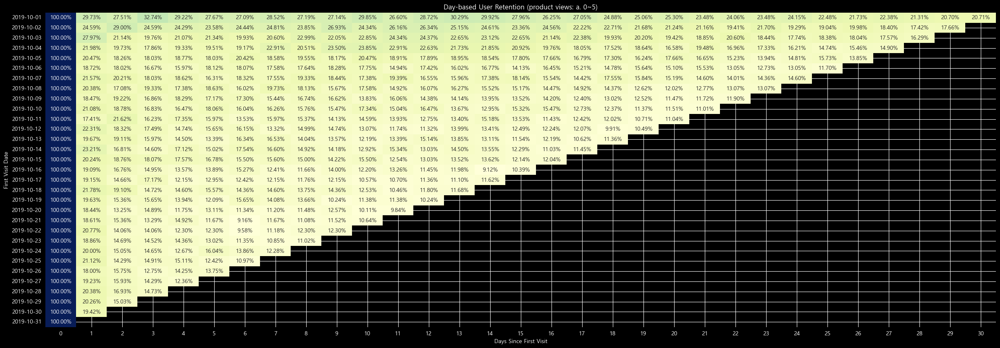

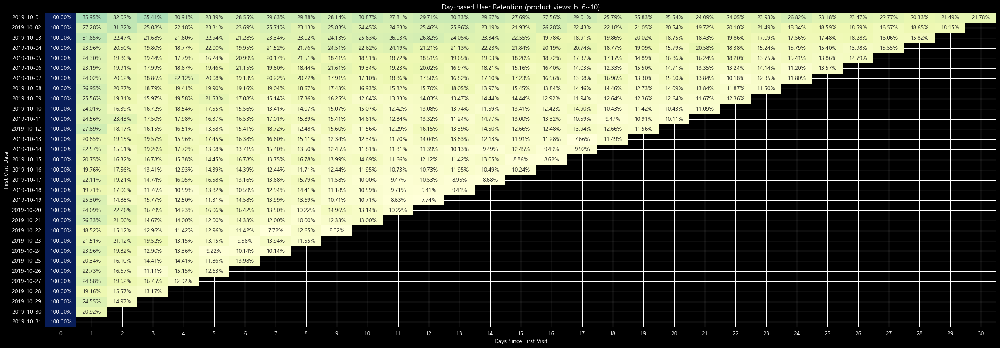

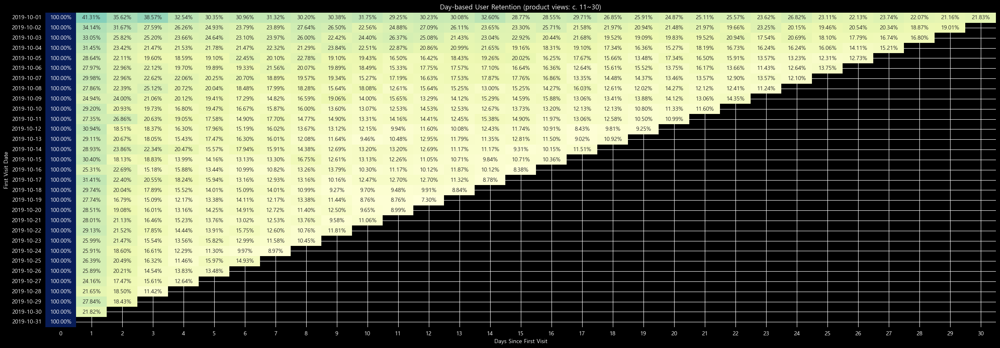

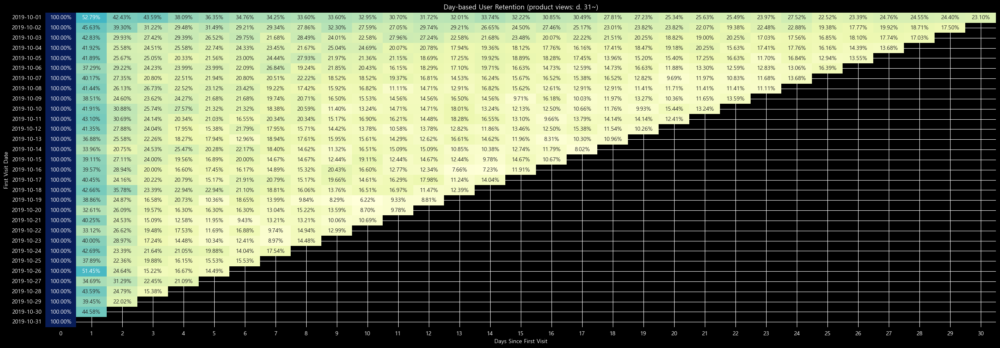

In [32]:
# a그룹, b그룹, c그룹, d그룹 별로 코호트 리텐션 시각화
for views in cohort_retention_pivot.index.levels[0]:
    plt.figure(figsize=(30, 10))
    sns.heatmap(cohort_retention_pivot.loc[views], annot=True, fmt=".2%", cmap="YlGnBu", cbar=False, mask=(retention_pivot == 0))
    plt.title(f"Day-based User Retention (product views: {views})")
    plt.xlabel("Days Since First Visit")
    plt.ylabel("First Visit Date")
    plt.show()

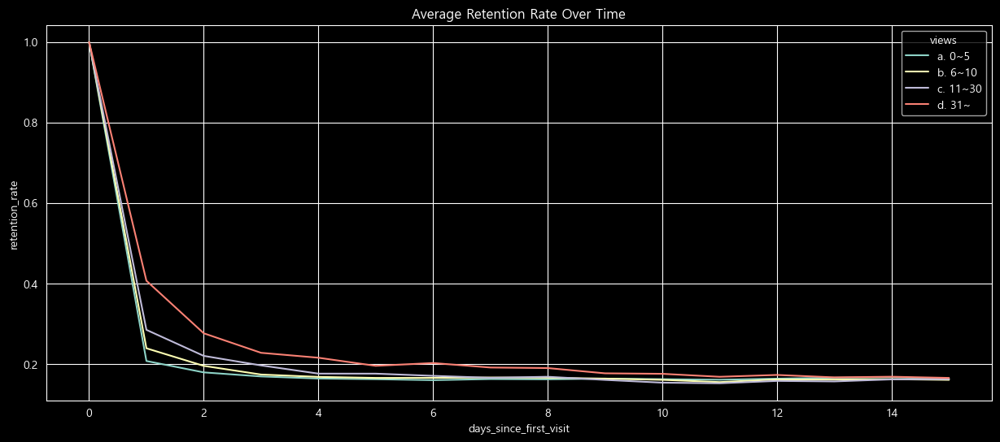

In [33]:
# a그룹, b그룹, c그룹, d그룹 별로 리텐션 커브 시각화
cohort_retention_avg = cohort_retention_rate.query('days_since_first_visit <= 15')\
.groupby(['days_since_first_visit', 'views'])['retention_rate'].mean().reset_index()

plt.figure(figsize=(15, 6))
sns.lineplot(x='days_since_first_visit', y='retention_rate', hue='views', data=cohort_retention_avg)
plt.title('Average Retention Rate Over Time')
plt.show()

### 리텐션 분석 결론

📌 핵심 인사이트

1. 초기 이탈 구간 (핵심 구간)

* 첫 방문 직후(Day0 → Day1)에 약 60~70% 사용자 이탈 발생

* 대부분의 이탈이 첫 방문 직후 구간에서 발생하는 핵심 이탈 구간


2. 유입 시점별 리텐션 차이

* 월초에 유입된 사용자일수록 리텐션이 더 높고 오래 유지되는 경향

* 유입 시점에 따라 사용자 유지율에 차이가 존재


3. 상품 탐색 활동과 리텐션 관계

* 상품조회수(view_count)가 높은 사용자일수록 초기 리텐션(Day1~Day3)이 높게 나타남

* 그러나 약 10일 이후에는 모든 그룹의 리텐션이 유사한 수준으로 수렴


4. 리텐션 영향 요인 해석

* 상품 탐색 활동은 초기 리텐션에 강한 영향을 미침

* 하지만 장기 리텐션을 설명하는 핵심 변수는 아님


🎯 Action 방향

1. 월초 유입 집중 전략

월초 유입 사용자의 리텐션이 높게 나타나므로 월초에 신규 유입 집중 확보

* ex) 월초 한정 쿠폰, 월초 신상품/기획전 노출, 월급일/소비주기 기반 프로모션 운영


2. 첫 방문 직후 탐색 유도 강화

Day0 → Day1 이탈이 가장 크므로 첫 방문 당일 사용자 행동 유도 필요

* ex) 인기 상품 추천, 최근 본 상품 리마인드, 첫 방문자 전용 추천 영역 제공

    * → 상품 조회 행동 증가 → 초기 리텐션 개선 유도

# 4. 데이터 마트 설계

## 4.1. KPI 분석용 데이터마트

In [36]:
# 기준: 일자(date_ymd)
# 목적: DAU, GMV, 전환율, 인당 조회수, 평균 체류시간 등 핵심 KPI 반복 분석

# 이벤트 더미 변수
data['is_view'] = (data['event_type'] == 'view').astype(int)
data['is_cart'] = (data['event_type'] == 'cart').astype(int)
data['is_purchase'] = (data['event_type'] == 'purchase').astype(int)

# 구매 이벤트 금액
data['purchase_price'] = np.where(data['event_type'] == 'purchase', data['price'], 0)

# 1) 일자 기준 기본 KPI 집계

mart_kpi_daily = (
    data.groupby('date_ymd')
    .agg(
        dau=('user_id', 'nunique'),
        view_count=('is_view', 'sum'),
        purchase_count=('is_purchase', 'sum'),
        gmv=('purchase_price', 'sum')
    )
    .reset_index()
)

# 2) 세션별 체류시간 계산 후 일자별 평균 체류시간 산출

session_duration = (
    data.groupby(['date_ymd', 'user_session'])
    .agg(
        session_start=('event_time', 'min'),
        session_end=('event_time', 'max')
    )
    .reset_index()
)

session_duration['duration_sec'] = (
    session_duration['session_end'] - session_duration['session_start']
).dt.total_seconds()

daily_duration = (
    session_duration.groupby('date_ymd')
    .agg(avg_duration_sec=('duration_sec', 'mean'))
    .reset_index()
)

# KPI 마트에 평균 체류시간 결합
mart_kpi_daily = mart_kpi_daily.merge(daily_duration, on='date_ymd', how='left')

# 3) 파생 KPI 생성

mart_kpi_daily['avg_view_per_user'] = mart_kpi_daily['view_count'] / mart_kpi_daily['dau']
mart_kpi_daily['view_to_purchase_rate'] = mart_kpi_daily['purchase_count'] / mart_kpi_daily['view_count']
mart_kpi_daily['avg_order_value'] = mart_kpi_daily['gmv'] / mart_kpi_daily['purchase_count']

mart_kpi_daily = mart_kpi_daily.replace([np.inf, -np.inf], np.nan)

display(mart_kpi_daily.head())

,date_ymd,dau,view_count,purchase_count,gmv,avg_duration_sec,avg_view_per_user,view_to_purchase_rate,avg_order_value
0,2019-10-01,12799,172221,2441,748890.62,497.343132,13.455817,0.014174,306.796649
1,2019-10-02,13074,169059,2447,773641.23,484.670291,12.930932,0.014474,316.159064
2,2019-10-03,12977,174081,2659,857984.08,495.753052,13.414580,0.015274,322.671711
3,2019-10-04,15907,211866,3628,1123036.87,496.113484,13.319042,0.017124,309.547098
4,2019-10-05,14282,199306,3258,1017097.86,532.591555,13.955048,0.016347,312.184733


## 4.2. 퍼널 분석용 데이터마트

In [38]:
# 기준: 세션(user_session)
# 목적: view → cart → purchase 전환 흐름 및 이탈 분석

mart_funnel_session = (
    data.groupby('user_session')
    .agg(
        user_id=('user_id', 'first'),

        # 행동 지표
        view_count=('event_type', lambda x: (x == 'view').sum()),
        cart_count=('event_type', lambda x: (x == 'cart').sum()),
        purchase_count=('event_type', lambda x: (x == 'purchase').sum()),

        # 상품 다양성
        unique_product_count=('product_id', 'nunique'),

        # 가격
        avg_price=('price', 'mean'),
        max_price=('price', 'max'),

        # ⭐ 바로 체류시간 계산 (중간 컬럼 없이)
        duration_sec=('event_time', lambda x: (x.max() - x.min()).total_seconds())
    )
    .reset_index()
)

# view 발생 세션만 필터링
mart_funnel_session = mart_funnel_session[mart_funnel_session['view_count'] > 0].copy()

# 퍼널 그룹 정의
mart_funnel_session['group'] = np.where(
    mart_funnel_session['cart_count'] > 0,
    'view_to_cart',
    'view_drop'
)

display(mart_funnel_session.head())

,user_session,user_id,view_count,cart_count,purchase_count,unique_product_count,avg_price,max_price,duration_sec,group
0,000001fd-1f89-45e8-a3ce-fe3218cabfad,560486342,6,4,1,3,164.438182,171.90,509.0,view_to_cart
1,00000aaa-d774-49bc-9c31-0c9f6e1c2f0a,522190704,1,0,0,1,468.220000,468.22,0.0,view_drop
2,00000e7e-fd0d-4f9e-b13b-bec0cfd54a2e,544174599,4,0,0,3,220.477500,262.30,78.0,view_drop
3,0000109a-4f63-48ef-9ff9-9ca024c6f17d,517613240,1,0,0,1,257.150000,257.15,0.0,view_drop
4,000036df-a712-4097-b47f-f2070d2ae5d9,515877056,9,0,0,1,362.430000,362.43,235.0,view_drop


# 4.3. 코호트 리텐션 분석용 데이터마트 설계

In [40]:
# 기준: first_visit_date × days_since_first_visit
# 목적: 시간 경과에 따른 사용자 유지율 분석

# 날짜 타입 변환
data['date_ymd'] = pd.to_datetime(data['date_ymd'])

# 1) 사용자별 최초 방문일 계산
user_first_visit = (
    data.groupby('user_id', as_index=False)
    .agg(first_visit_date=('date_ymd', 'min'))
)

# 2) 사용자 활동일 (중복 제거)
user_active_day = data[['user_id', 'date_ymd']].drop_duplicates()

# 3) 최초 방문일과 활동일 결합
cohort_base = user_active_day.merge(user_first_visit, on='user_id', how='left')

# 4) 최초 방문 이후 경과일 계산
cohort_base['days_since_first_visit'] = (
    cohort_base['date_ymd'] - cohort_base['first_visit_date']
).dt.days

# 5) 코호트별 재방문 사용자 수 집계
retained_users = (
    cohort_base.groupby(['first_visit_date', 'days_since_first_visit'])
    .agg(retained_users=('user_id', 'nunique'))
    .reset_index()
)

# 6) 코호트별 전체 사용자 수
cohort_size = (
    user_first_visit.groupby('first_visit_date')
    .agg(total_users_cohort=('user_id', 'nunique'))
    .reset_index()
)

# 7) 결합 및 리텐션율 계산
mart_retention_cohort = retained_users.merge(
    cohort_size,
    on='first_visit_date',
    how='left'
)

mart_retention_cohort['retention_rate'] = (
    mart_retention_cohort['retained_users'] /
    mart_retention_cohort['total_users_cohort']
)

display(mart_retention_cohort.head())

,first_visit_date,days_since_first_visit,retained_users,total_users_cohort,retention_rate
0,2019-10-01,0,12799,12799,1.000000
1,2019-10-01,1,4654,12799,0.363622
2,2019-10-01,2,4103,12799,0.320572
3,2019-10-01,3,4596,12799,0.359091
4,2019-10-01,4,4012,12799,0.313462


# 5. 최종 결론

모든 성과는 **유입 → 탐색 → 전환 → 유지**의 흐름 속에서
**초기 탐색 경험**에 의해 결정된다.

---

### KPI 설정 및 분석

1. GMV 결정 구조
* GMV는 DAU(유입)와 구매전환율(전환)에 의해 결정되는 구조

2. 매출 영향 요인
* 매출 변동은 **유입 규모** + **구매전환 효율** 변화에 직접적인 영향을 받음

3. 핵심 지표
* 구매전환율 개선이 매출 성과를 높이는 핵심 지표임을 확인

---

### 퍼널 분석

1. 주요 이탈 구간
* View → Cart 전환율 약 1.95%로 주요 이탈 구간

2. 전환 사용자 특징
* 전환 그룹은 소수 상품을 깊게 탐색하며 조회 상품 가격 수준(avg/max price)이 높은 경향

3. 이탈 사용자 특징
* 이탈 그룹은 다양한 상품을 넓게 탐색하지만 구매로 이어지지 않는 패턴을 보임

---

### 리텐션 분석

1. 초기 이탈
* 첫 방문 직후(Day0 → Day1)에 약 60~70% 사용자 이탈 발생

2. 탐색과 리텐션 관계
* 상품조회수(view_count)가 높을수록 초기 리텐션(Day1~Day3)이 높게 나타남

3. 유입 시점 영향
* 월초에 유입된 사용자일수록 리텐션이 더 높고 오래 유지되는 경향

---

### 최종 인사이트

* 결국, **유입을 늘리고 사용자의 초기 탐색 경험을 개선하는 것**이 전환과 리텐션을 동시에 높여 **GMV 성장을 이끌 수 있는 핵심 전략이다.**

# 6. Tableau 대시보드 시각화

https://public.tableau.com/app/profile/.15236778/viz/Kaggle_ecommerce_dashboard/KPI